In [2]:
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns
import matplotlib as plt
import scrublet as scr


ModuleNotFoundError: No module named 'scrublet'

In [3]:
adata = sc.read(r"E:\scRNA-seq_matched sample\GEX_1st (1).h5ad")

In [6]:
#sc.pp.subsample(adata2,0.3)

In [7]:
#adata2.write(r"E:\scRNA-seq_matched sample\GEX_1st_subsample_03.h5ad")

In [4]:
adata2=sc.AnnData(adata.raw.X)

In [5]:
adata2.var=adata.raw.var
adata2.obs=adata.obs

In [5]:
adata=adata2

In [6]:
adata.obs

,Sample,ATAC,Pool,Day,batch,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,n_genes,leiden,Clt1
AAAGCCGCAACTAGGG-1-HCA_A_LNG11599017,HCA_A_LNG11599017,HCA_A_LNG11986504,pre,pre,HCA_A_LNG11599017,4355,10219.0,23.0,0.225071,4355,38,Dividing
AAAGGACGTTACTAGG-1-HCA_A_LNG11599017,HCA_A_LNG11599017,HCA_A_LNG11986504,pre,pre,HCA_A_LNG11599017,631,830.0,44.0,5.301205,631,44,Neuroendocrine
AACCCGCAGGGTGAAC-1-HCA_A_LNG11599017,HCA_A_LNG11599017,HCA_A_LNG11986504,pre,pre,HCA_A_LNG11599017,1101,1445.0,8.0,0.553633,1101,13,Neuroendocrine
AACCCGCAGTTATCCT-1-HCA_A_LNG11599017,HCA_A_LNG11599017,HCA_A_LNG11986504,pre,pre,HCA_A_LNG11599017,837,1005.0,14.0,1.393035,837,50,Neuroendocrine
AACCGGCTCGGTTAGT-1-HCA_A_LNG11599017,HCA_A_LNG11599017,HCA_A_LNG11986504,pre,pre,HCA_A_LNG11599017,1632,2268.0,69.0,3.042328,1632,50,Neuroendocrine
...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTGTTCTTTAGGA-1-HCA_A_LNG12177517,HCA_A_LNG12177517,HCA_A_LNG11986519,E,Day5,HCA_A_LNG12177517,1912,3492.0,4.0,0.114548,1912,1,AT1
TTTGTTGGTCTCACTG-1-HCA_A_LNG12177517,HCA_A_LNG12177517,HCA_A_LNG11986519,E,Day5,HCA_A_LNG12177517,1466,2397.0,18.0,0.750939,1466,9,AT2
TTTGTTGGTGAAACAA-1-HCA_A_LNG12177517,HCA_A_LNG12177517,HCA_A_LNG11986519,E,Day5,HCA_A_LNG12177517,3525,8302.0,89.0,1.072031,3525,18,Macrophage
TTTGTTGGTGCAACTA-1-HCA_A_LNG12177517,HCA_A_LNG12177517,HCA_A_LNG11986519,E,Day5,HCA_A_LNG12177517,2410,5418.0,1.0,0.018457,2410,0,AT2


In [7]:
azimut=pd.read_csv(r"E:\scRNA-seq_matched sample\azimuth_pred_2.tsv",sep='\t')

In [8]:
azimut

,cell,predicted.ann_level_3,predicted.ann_finest_level,predicted.ann_level_4,predicted.ann_level_3.score,predicted.ann_finest_level.score,predicted.ann_level_4.score,mapping.score
0,GTTGCATAGTTAGGCT-1-HCA_A_LNG12177505,Fibroblasts,Alveolar fibroblasts,Alveolar fibroblasts,0.904053,0.820915,0.820915,0.925496
1,CTTGTTCCAAACATAG-1-HCA_A_LNG12177505,Multiciliated lineage,Multiciliated (non-nasal),Multiciliated,0.750064,0.750064,0.750064,0.875289
2,CCCTGGACAACATAAG-1-HCA_A_LNG12177516,T cell lineage,CD4 T cells,CD4 T cells,0.678895,0.498566,0.498566,0.380937
3,TTGTGTGCAGCTTAGC-1-HCA_A_LNG12177504,T cell lineage,CD4 T cells,CD4 T cells,0.543960,0.373449,0.373449,0.280616
4,CATCATGCAAACTAAG-1-HCA_A_LNG12177512,AT1,AT1,None,0.660354,0.660354,0.692089,0.617887
...,...,...,...,...,...,...,...,...
18943,TTGAGGCGTTCCTGAT-1-HCA_A_LNG12177506,AT2,AT2 proliferating,AT2 proliferating,0.442201,0.442201,0.442201,0.966950
18944,TACTTGTTCCCATAGG-1-HCA_A_LNG12177508,Fibroblasts,Adventitial fibroblasts,Adventitial fibroblasts,0.926209,0.632078,0.632078,0.941781
18945,CTTAATGAGGGATGCG-1-HCA_A_LNG12177515,EC capillary,EC general capillary,EC general capillary,0.457390,0.457390,0.457390,0.971151
18946,CAAGGTTTCGCGCTAA-1-HCA_A_LNG12177516,Fibroblasts,Alveolar fibroblasts,Alveolar fibroblasts,0.852426,0.670671,0.670671,0.486979


In [10]:
dictio=dict(zip(azimut['cell'],azimut['predicted.ann_level_4']))
adata.obs['azimut_predicted_4']=list(adata.obs.index.map(dictio))
dictio=dict(zip(azimut['cell'],azimut['predicted.ann_level_3']))
adata.obs['azimut_predicted_3']=list(adata.obs.index.map(dictio))

In [11]:
# mitochondrial genes
adata.var['mt'] = adata.var_names.str.startswith('MT-') 
# ribosomal genes
adata.var['ribo'] = adata.var_names.str.startswith(("RPS","RPL"))
# hemoglobin genes.
adata.var['hb'] = adata.var_names.str.contains(("^HB[^(P)]"))

adata.var

,gene_ids,feature_types,mt,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts,n_cells,highly_variable,means,dispersions,dispersions_norm,ribo,hb
MIR1302-2HG,ENSG00000243485,Gene Expression,False,3,0.000038,99.996228,3.0,3,False,0.000017,0.171263,-2.869669,False,False
AL627309.1,ENSG00000238009,Gene Expression,False,816,0.010661,98.974127,848.0,814,False,0.016503,1.943655,0.110680,False,False
AL627309.3,ENSG00000239945,Gene Expression,False,11,0.000138,99.986171,11.0,11,False,0.000150,0.360235,-2.551906,False,False
AL627309.2,ENSG00000239906,Gene Expression,False,6,0.000075,99.992457,6.0,6,False,0.000170,1.042567,-1.404536,False,False
AL627309.5,ENSG00000241860,Gene Expression,False,4291,0.061754,94.605366,4912.0,4278,False,0.095937,1.898269,0.034362,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
AC136616.2,ENSG00000277761,Gene Expression,False,3,0.000038,99.996228,3.0,3,False,0.000012,-0.183238,-3.465776,False,False
AC023491.2,ENSG00000278633,Gene Expression,False,151,0.002062,99.810163,164.0,150,False,0.001701,1.350673,-0.886443,False,False
AC007325.1,ENSG00000276017,Gene Expression,False,68,0.000855,99.914511,68.0,68,False,0.000862,1.341907,-0.901183,False,False
AC007325.4,ENSG00000278817,Gene Expression,False,437,0.005620,99.450605,447.0,437,False,0.007949,1.923927,0.077508,False,False


In [12]:
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt','ribo','hb'], percent_top=None, log1p=False, inplace=True)


In [13]:
mito_genes = adata.var_names.str.startswith('MT-')
# for each cell compute fraction of counts in mito genes vs. all genes
# the `.A1` is only necessary as X is sparse (to transform to a dense array after summing)
adata.obs['percent_mt2'] = np.sum(
    adata[:, mito_genes].X, axis=1) / np.sum(adata.X, axis=1)
# add the total counts per cell as observations-annotation to adata
adata.obs['n_counts'] = adata.X.sum(axis=1)



In [14]:
#adata = adata[adata.obs.n_genes_by_counts < 2500, :]
adata = adata[adata.obs['percent_mt2'] < 5, :]

In [15]:
adata

View of AnnData object with n_obs × n_vars = 63161 × 34526
    obs: 'Sample', 'ATAC', 'Pool', 'Day', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_genes', 'leiden', 'Clt1', 'azimut_predicted_4', 'azimut_predicted_3', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'percent_mt2', 'n_counts'
    var: 'gene_ids', 'feature_types', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'ribo', 'hb'

In [16]:
sc.pp.filter_cells(adata, min_genes=200)
sc.pp.filter_genes(adata, min_cells=3)
print(adata.n_obs, adata.n_vars)

Trying to set attribute `.obs` of view, copying.


63161 33870


In [17]:
adata

AnnData object with n_obs × n_vars = 63161 × 33870
    obs: 'Sample', 'ATAC', 'Pool', 'Day', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_genes', 'leiden', 'Clt1', 'azimut_predicted_4', 'azimut_predicted_3', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'percent_mt2', 'n_counts'
    var: 'gene_ids', 'feature_types', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'ribo', 'hb'

In [18]:
# save normalized counts in raw slot.
adata.raw = adata
# normalize to depth 10 000
sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e4)
# logaritmize
sc.pp.log1p(adata)
# scale
#sc.pp.scale(adata)

In [19]:
#sc.tl.score_genes_cell_cycle(adata, s_genes=s_genes, g2m_genes=g2m_genes)

In [20]:
sc.pp.highly_variable_genes(adata, min_mean=0.010, max_mean=9, min_disp=0.5)
adata = adata[:, adata.var.highly_variable]

In [21]:
#sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)
#adata = adata[:, adata.var.highly_variable]
#sc.pp.regress_out(adata, ['total_counts', 'pct_counts_mt'])
sc.pp.scale(adata, max_value=10)
sc.tl.pca(adata, svd_solver='arpack')
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=40)
sc.tl.umap(adata)

C:\Users\sergio.salas\Miniconda3\lib\site-packages\scanpy\preprocessing\_simple.py:843: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [62]:
sc.tl.leiden(adata,resolution=0.8,key_added='leiden_new')

In [ ]:
sc.pl.umap(adata, color=['leiden_new'],save='leiden_new.pdf')

In [ ]:
sc.pl.umap(adata, color=['azimut_predicted_3'],s=10)

In [27]:
adatasub=adata[adata.obs['azimut_predicted_3']!='nan']

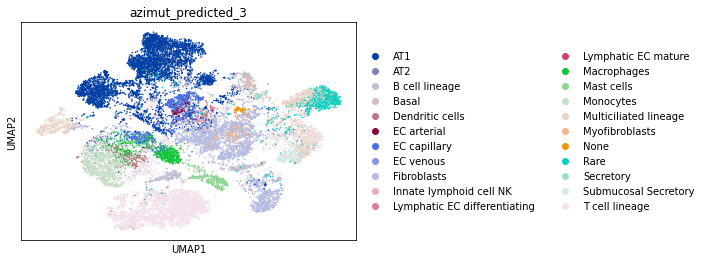

In [86]:
sc.pl.umap(adatasub, color=['azimut_predicted_3'],s=10,save='_azimuth_predicted.pdf')

In [ ]:
sc.pl.umap(adata, color=['Clt1'],s=5,save='clt1.pdf')

In [ ]:
sc.tl.rank_genes_groups(adata, 'leiden_new', method='wilcoxon', key_added = "wilcoxon")
sc.pl.rank_genes_groups(adata, n_genes=10, sharey=False, key="wilcoxon",save='markers_leiden_new.pdf')

In [ ]:
sc.tl.rank_genes_groups(adata, 'Clt1', method='wilcoxon', key_added = "wilcoxon")
sc.pl.rank_genes_groups(adata, n_genes=10, sharey=False, key="wilcoxon",save='markers_Clt.pdf')

In [ ]:
sc.pl.umap(adata, color=['Pool'],s=5,save='pool.pdf')

In [88]:
adata.write('E:/scRNA-seq_matched sample/adata_processed_with_azimuth.h5ad')

In [8]:
adata=sc.read(r'E:/scRNA-seq_matched sample/adata_processed_with_azimuth.h5ad')

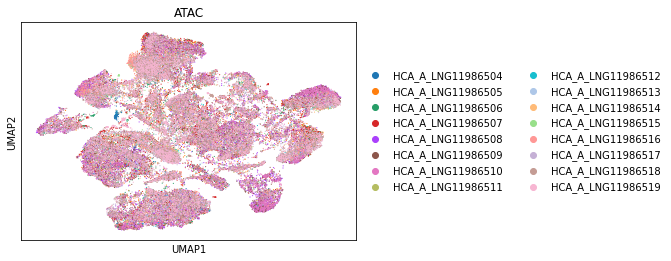

In [13]:
sc.pl.umap(adata, color=['ATAC'],s=5)#,save='pool.pdf')

In [14]:
adata.obs.columns

Index(['Sample', 'ATAC', 'Pool', 'Day', 'batch', 'n_genes_by_counts',
       'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_genes', 'leiden',
       'Clt1', 'azimut_predicted_4', 'azimut_predicted_3', 'total_counts_ribo',
       'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'percent_mt2',
       'n_counts', 'leiden_new'],
      dtype='object')

In [76]:
crosmat=pd.crosstab(adata.obs['leiden_new'],adata.obs['azimut_predicted_3'])
crosmat2=crosmat.iloc[:,0:22]
crosmat2.columns=crosmat2.columns.astype(str)

In [77]:
cd=crosmat2.div(np.sum(crosmat2,axis=1),axis=0)

In [78]:
cd.columns=cd.columns.astype(str)

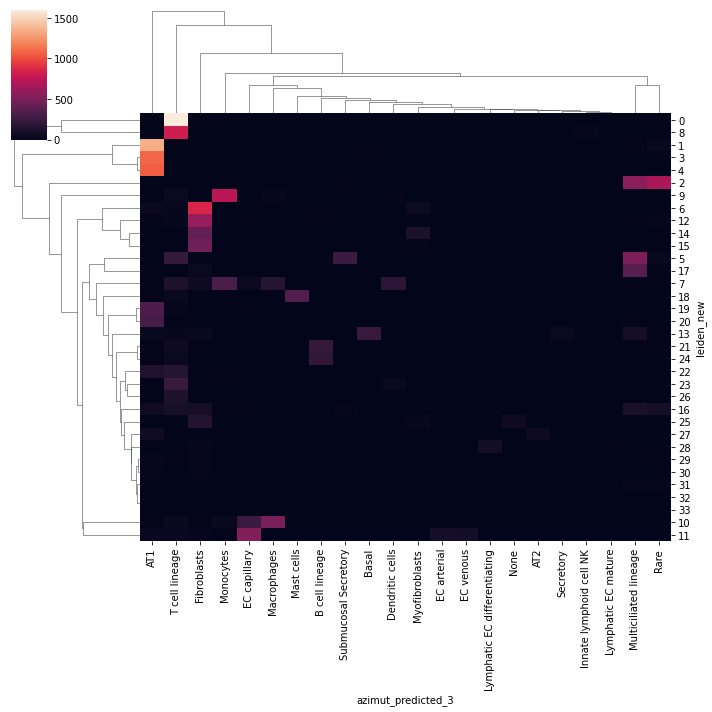

In [79]:
sns.clustermap(crosmat2)

In [ ]:
sc.pl.umap(adata, color=['LYZ','BPIFB1','SLPI'])

In [34]:
adata

Index(['PLEKHN1', 'TNFRSF4', 'AL645728.1', 'CFAP74', 'AL139246.5', 'AJAP1',
       'AL365255.1', 'CHD5', 'HES2', 'PLEKHG5',
       ...
       'MT-CO2', 'MT-ATP8', 'MT-ATP6', 'MT-CO3', 'MT-ND3', 'MT-ND4L', 'MT-ND4',
       'MT-ND5', 'MT-ND6', 'MT-CYB'],
      dtype='object', length=4425)

In [60]:
sc.tl.leiden(adata, key_added = "leiden_1.0") # default resolution in 1.0
sc.tl.leiden(adata, resolution = 0.6, key_added = "leiden_0.6")
sc.tl.leiden(adata, resolution = 0.4, key_added = "leiden_0.4")
sc.tl.leiden(adata, resolution = 1.4, key_added = "leiden_1.4")

In [61]:
# PERFORM CLUSTERING

In [ ]:
sc.pl.umap(adata, color=['Myoc'],vmax=2)

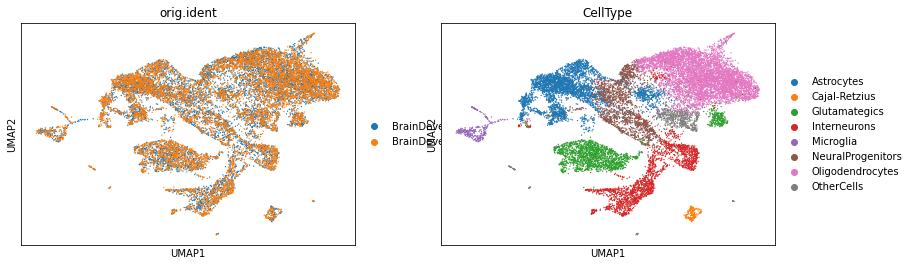

In [62]:
sc.pl.umap(adata, color=['orig.ident','CellType'])

In [ ]:
gen=pd.read_csv('D:/mouse_gene_selection_Neurogenesiss/Mus_musculus_dRNA_probes.csv',sep=';')
gel=gen[gen['Project'].isin(['NeurogenesISS'])]
gel['Gene']

# CHECK UTILITY OF CURRENT MARKERS

In [ ]:
for e in gel['Gene']:
    try:
        sc.pl.umap(adata, color=[e],vmax=5)
    except:
        print(e)

In [ ]:
sc.pl.dotplot(adata,adata.var.index[adata.var.index.isin(gel['Gene'])],groupby='leiden_1.0')

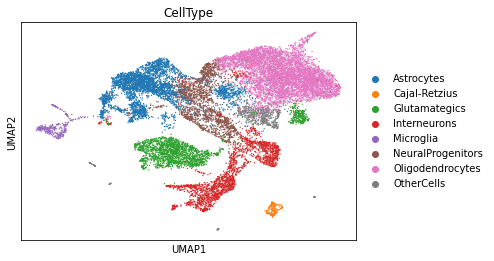

In [69]:
sc.pl.umap(adata, color=['CellType'])

In [ ]:
sc.pl.umap(adata, color=['Subclusters'],palette='gist_ncar',add_outline=True,save='Clusters_subclusters.pdf')

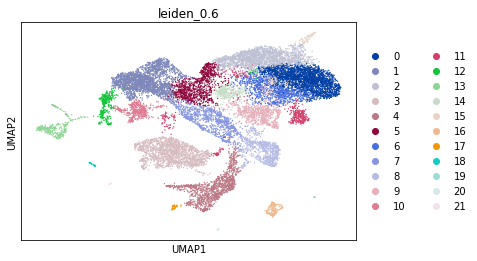

In [72]:
sc.pl.umap(adata, color=['leiden_0.6'],save='leiden0.6.pdf')

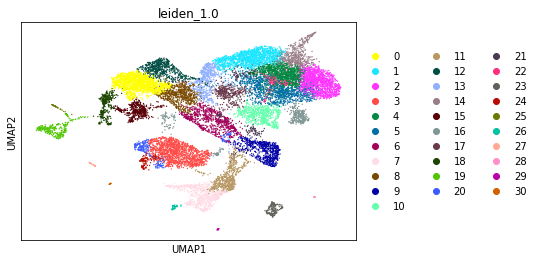

In [73]:
sc.pl.umap(adata, color=['leiden_1.0'],save='leiden1.0.pdf')

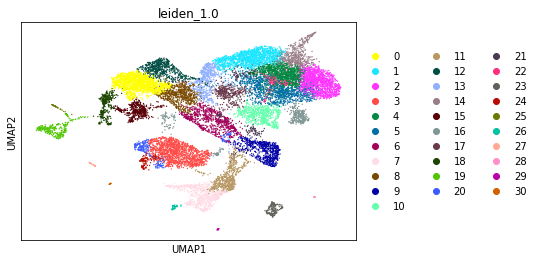

In [74]:
sc.pl.umap(adata, color=['leiden_1.0'])

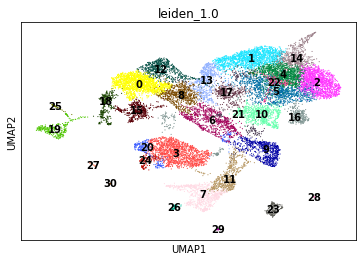

In [75]:
sc.pl.umap(adata, color=['leiden_1.0'],legend_loc='on data',size=5,legend_fontsize=10,save='umap_mouse_onsite_10.pdf')

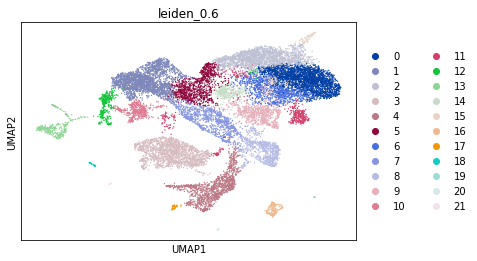

In [76]:
sc.pl.umap(adata, color=['leiden_0.6'])

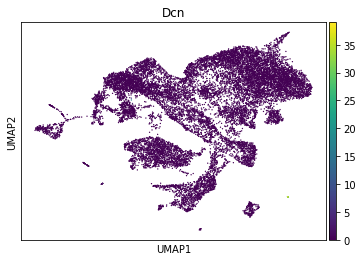

In [58]:
#VLMC markers
sc.pl.umap(adata, color=['Dcn'])


In [ ]:
sc.pl.dotplot(adata,adata.var.index[adata.var.index.isin(gel['Gene'])],groupby='leiden_1.0',standard_scale='var')

In [79]:
sc.tl.rank_genes_groups(adata, 'leiden_1.0', method='wilcoxon', key_added = "wilcoxon")


In [ ]:
sc.tl.rank_genes_groups(adata, 'leiden_1.0', method='wilcoxon', key_added = "wilcoxon")

sc.pl.rank_genes_groups(adata, n_genes=5, sharey=False, key="wilcoxon",save='markers_leiden1_0.pdf')

In [ ]:
sc.tl.rank_genes_groups(adata, 'leiden_1.4', method='wilcoxon', key_added = "comp", groups=['3','9','0'], reference='2')
sc.pl.rank_genes_groups(adata, n_genes=5, sharey=False, key="comp")

In [82]:
adata

AnnData object with n_obs × n_vars = 16825 × 2318
    obs: 'Unnamed: 0', 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'RNA_snn_res.0.2', 'RNA_snn_res.2.4', 'seurat_clusters', 'Selected_Cells', 'Condition', 'Batch', 'sample_name', 'origen', 'S.Score', 'G2M.Score', 'Phase', 'old.ident', 'RNA_snn_res.0.05', 'RNA_snn_res.0.1', 'RNA_snn_res.0.3', 'RNA_snn_res.0.4', 'RNA_snn_res.0.5', 'RNA_snn_res.0.6', 'RNA_snn_res.0.8', 'RNA_snn_res.1', 'RNA_snn_res.1.2', 'RNA_snn_res.1.8', 'Glutamatergic.mean', 'Interneurons.mean', 'CellType', 'Subclusters', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'percent_mt2', 'n_counts', 'n_genes', 'leiden_1.0', 'leiden_0.6', 'leiden_0.4', 'leiden_1.4'
    var: 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    un

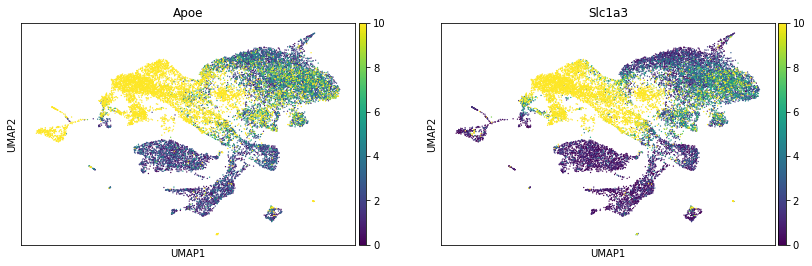

In [83]:
sc.pl.umap(adata, color=['Apoe','Slc1a3'],vmax=10)

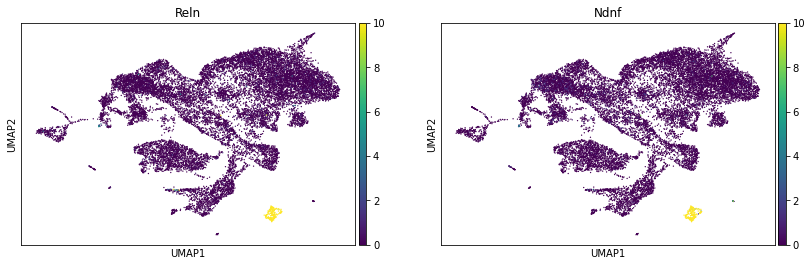

In [84]:
sc.pl.umap(adata, color=['Reln','Ndnf'],vmax=10)

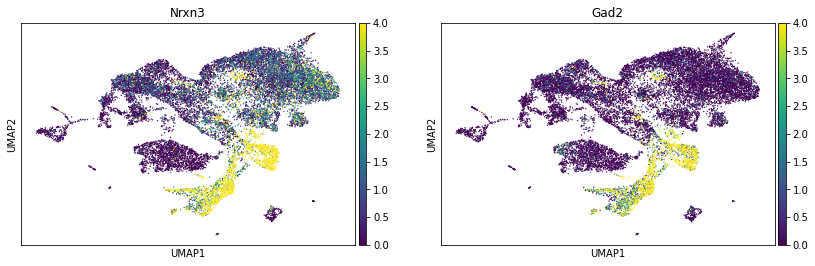

In [85]:
sc.pl.umap(adata, color=['Nrxn3','Gad2'],vmax=4)

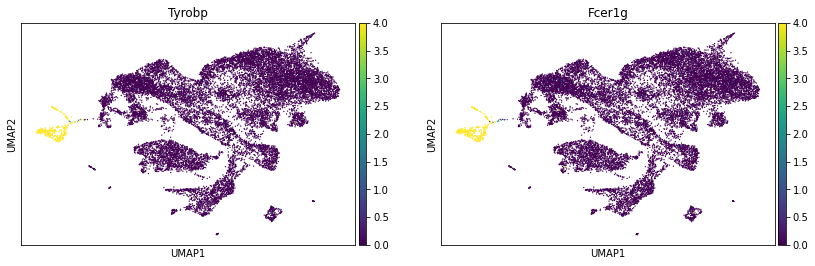

In [86]:
sc.pl.umap(adata, color=['Tyrobp','Fcer1g'],vmax=4)

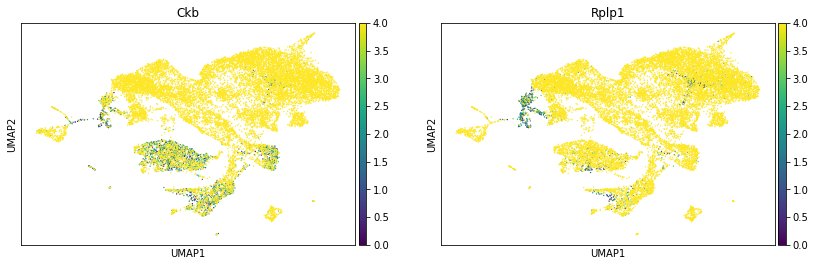

In [87]:
sc.pl.umap(adata, color=['Ckb','Rplp1'],vmax=4)

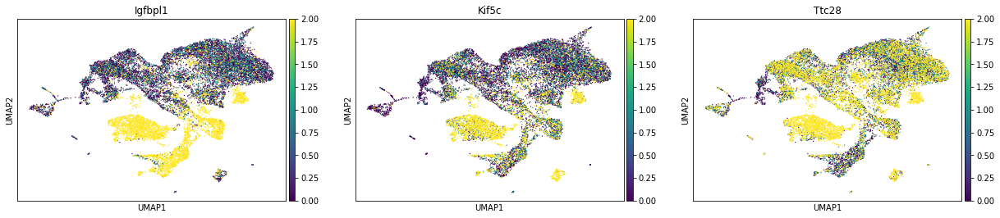

In [88]:
sc.pl.umap(adata, color=['Igfbpl1','Kif5c','Ttc28'],vmax=2)

In [89]:
#goomarkers

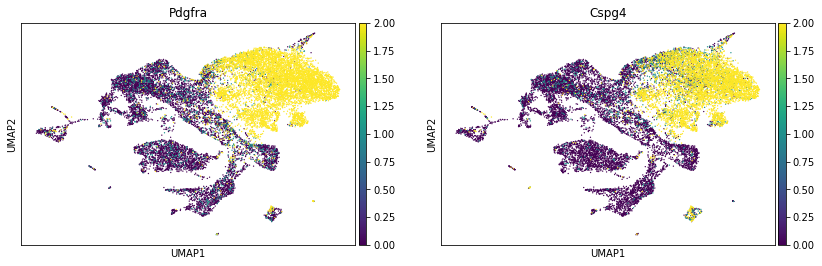

In [90]:
sc.pl.umap(adata, color=['Pdgfra','Cspg4'],vmax=2) #cl1

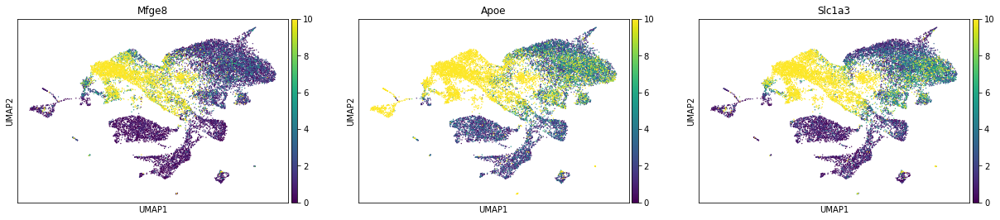

In [91]:
sc.pl.umap(adata, color=['Mfge8','Apoe','Slc1a3'],vmax=10)

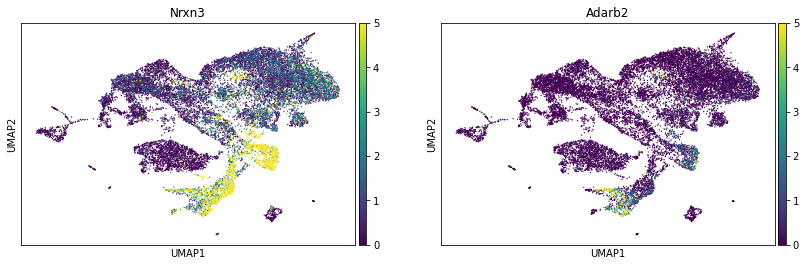

In [92]:
sc.pl.umap(adata, color=['Nrxn3','Adarb2'],vmax=5)

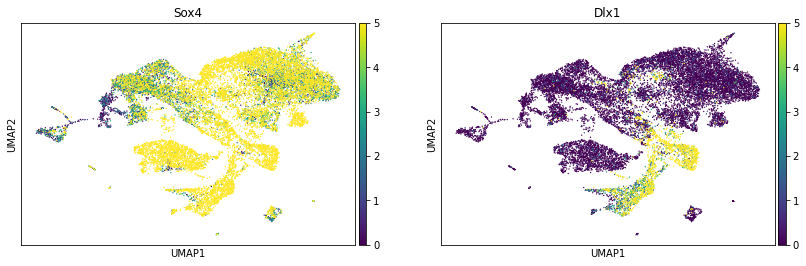

In [93]:
sc.pl.umap(adata, color=['Sox4','Dlx1'],vmax=5)

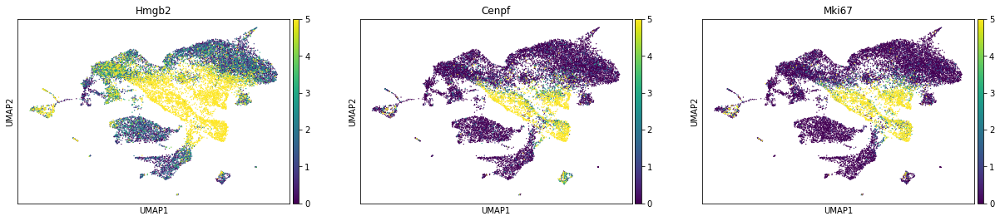

In [94]:
sc.pl.umap(adata, color=['Hmgb2','Cenpf','Mki67'],vmax=5)

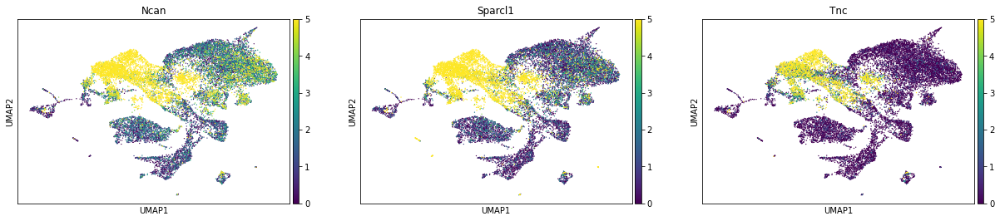

In [95]:
sc.pl.umap(adata, color=['Ncan','Sparcl1','Tnc'],vmax=5)

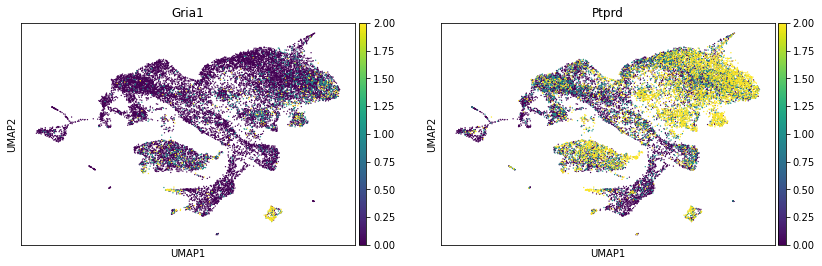

In [96]:
sc.pl.umap(adata, color=['Gria1','Ptprd'],vmax=2)

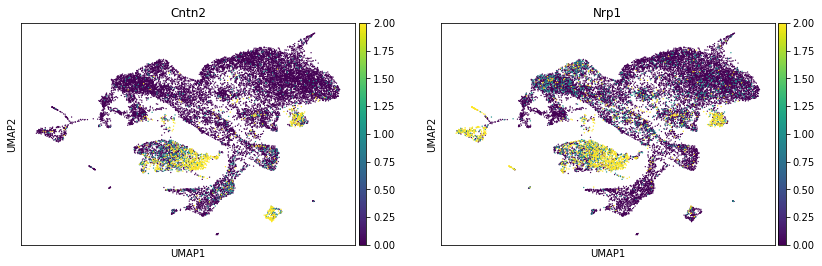

In [97]:
sc.pl.umap(adata, color=['Cntn2','Nrp1'],vmax=2)

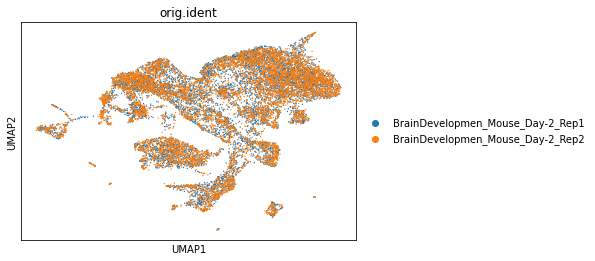

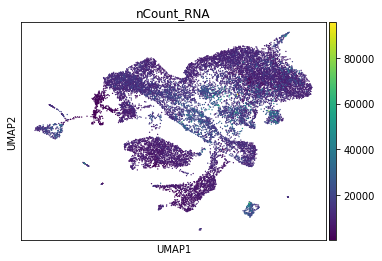

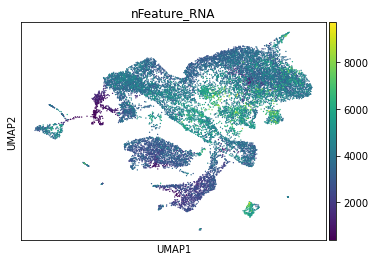

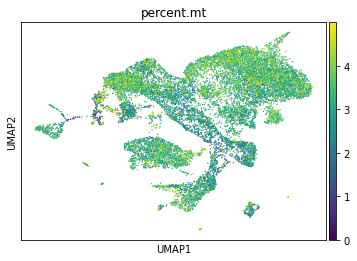

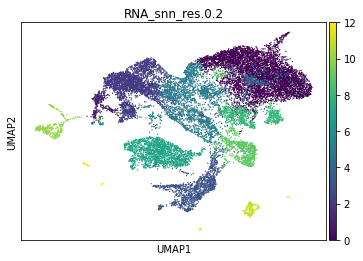

...

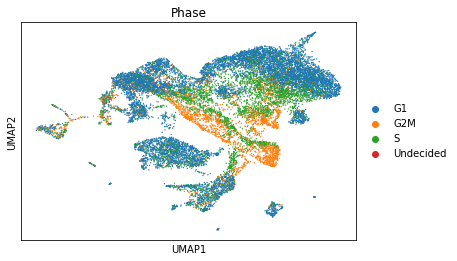

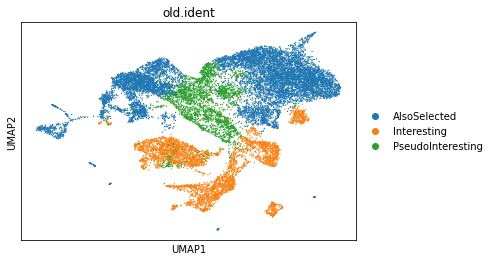

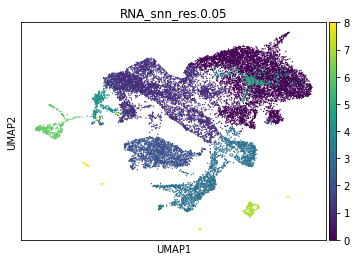

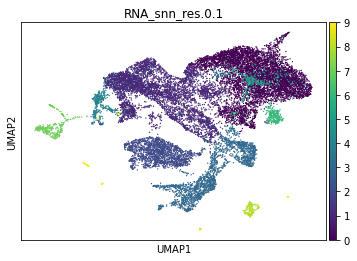

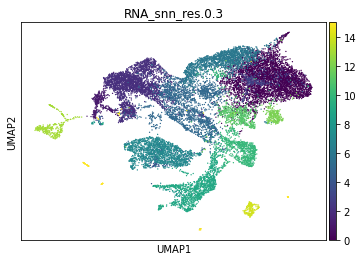

In [98]:
for par in adata.obs.columns[1:20]:
    sc.pl.umap(adata, color=[par])

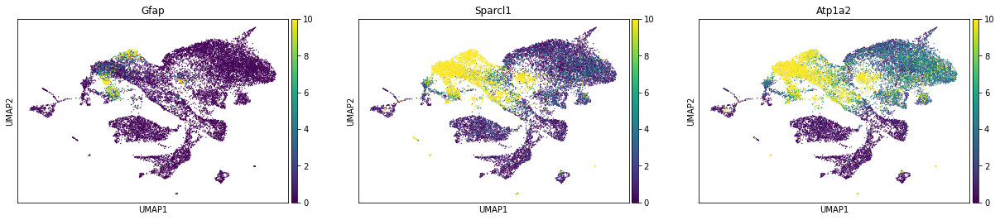

In [120]:

sc.pl.umap(adata, color=['Gfap','Sparcl1','Atp1a2'],vmax=10)

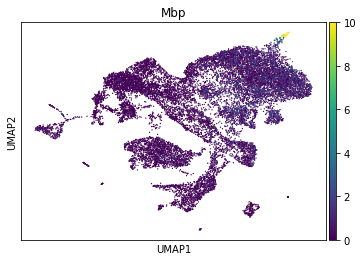

In [100]:
sc.pl.umap(adata, color=['Mbp'],vmax=10)

In [ ]:
# expression from glut/gaba

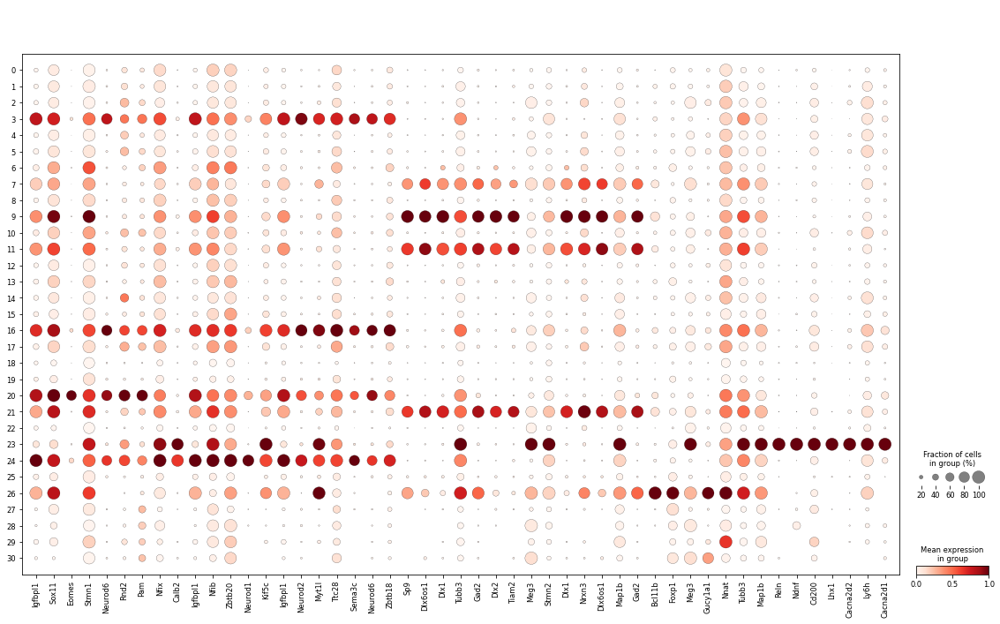

In [124]:
markers=pd.DataFrame(adata.uns['wilcoxon']['names']).head(7)
total=[]
for cols in ['20','24','3','11','7','26','23']:
    for rows in markers.index:
        total.append(markers.loc[rows,cols])

sc.pl.dotplot(adata, total, groupby = 'leiden_1.0',standard_scale='var')

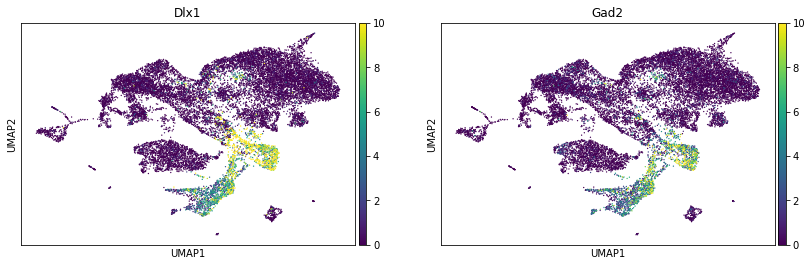

In [138]:
sc.pl.umap(adata, color=['Dlx1','Gad2'],vmax=10)

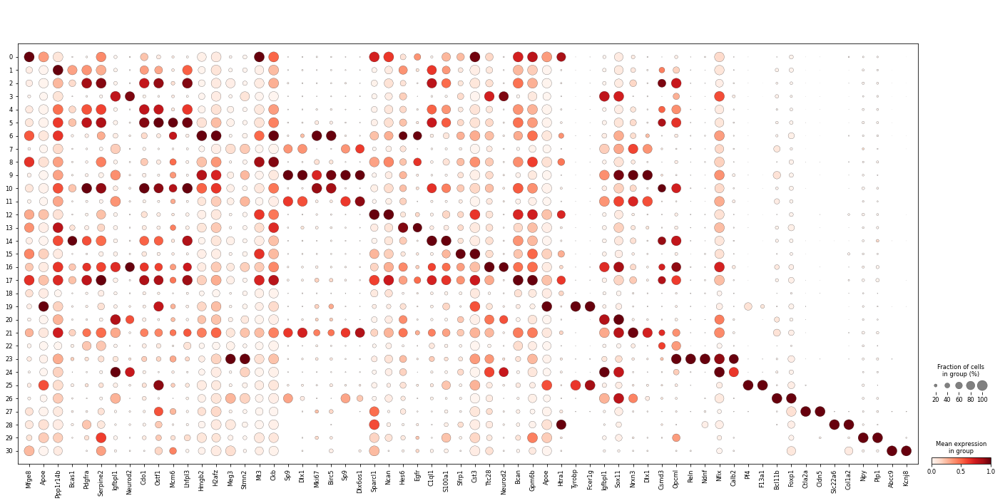

In [103]:
markers=pd.DataFrame(adata.uns['wilcoxon']['names']).head(2)
total=[]
for cols in markers.columns:
    for rows in markers.index:
        total.append(markers.loc[rows,cols])

sc.pl.dotplot(adata, total, groupby = 'leiden_1.0',standard_scale='var')

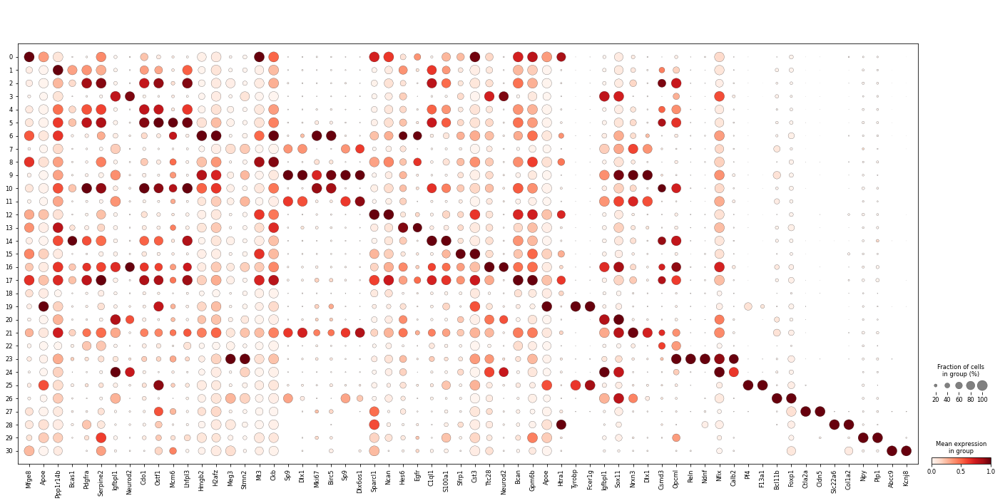

In [104]:
sc.pl.dotplot(adata, total, groupby = 'leiden_1.0',standard_scale='var')


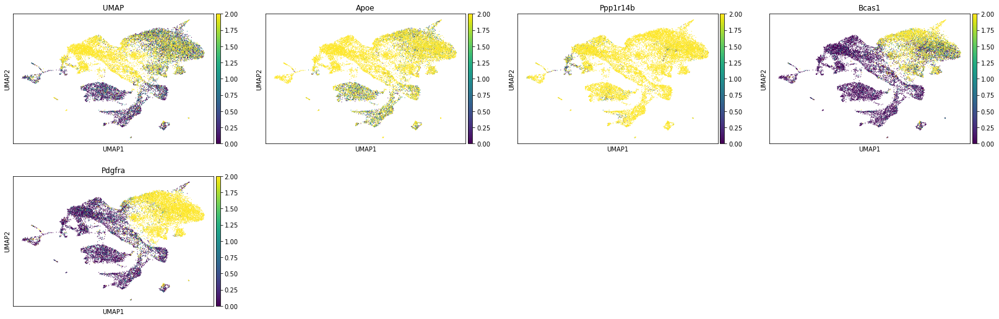

In [105]:
sc.pl.umap(adata, color=total[0:5], title="UMAP",legend_loc='on data',size=5,legend_fontsize=10,vmax=2)

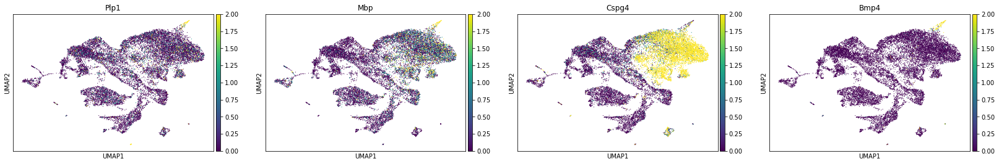

In [111]:
sc.pl.umap(adata, color=['Plp1','Mbp','Cspg4','Bmp4'],legend_loc='on data',size=5,legend_fontsize=10,vmax=2)

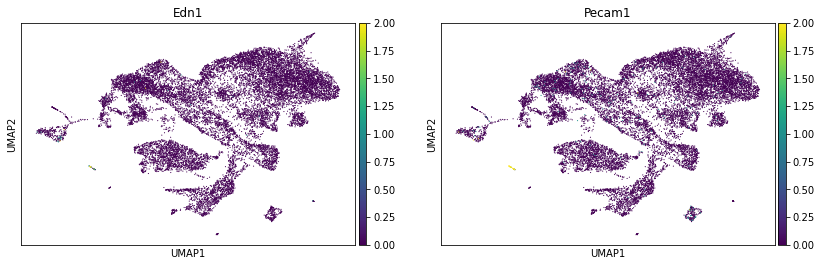

In [4]:
sc.pl.umap(adata, color=['Edn1','Pecam1'],legend_loc='on data',size=5,legend_fontsize=10,vmax=2) #endothelial markers

In [107]:
sc.pp.subsample(adata,0.1)

In [128]:
adata

AnnData object with n_obs × n_vars = 1059 × 2348
    obs: 'Unnamed: 0', 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'RNA_snn_res.0.2', 'RNA_snn_res.2.4', 'seurat_clusters', 'Selected_Cells', 'Condition', 'Batch', 'sample_name', 'origen', 'S.Score', 'G2M.Score', 'Phase', 'old.ident', 'RNA_snn_res.0.05', 'RNA_snn_res.0.1', 'RNA_snn_res.0.3', 'RNA_snn_res.0.4', 'RNA_snn_res.0.5', 'RNA_snn_res.0.6', 'RNA_snn_res.0.8', 'RNA_snn_res.1', 'RNA_snn_res.1.2', 'RNA_snn_res.1.8', 'Glutamatergic.mean', 'Interneurons.mean', 'CellType', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'percent_mt2', 'n_counts', 'n_genes', 'leiden_1.0', 'leiden_0.6', 'leiden_0.4', 'leiden_1.4'
    var: 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'orig.ident_c

In [139]:
adata.write('D:/mouse_gene_selection_Neurogenesiss/single_cell_day2_mouse_all/adata_filt_mouse.h5')

In [108]:
adata.write('D:/mouse_gene_selection_Neurogenesiss/single_cell_day2_mouse_all/adata_filt_mouse_subsamp.h5ad')

In [3]:
adata=sc.read('D:/mouse_gene_selection_Neurogenesiss/single_cell_day2_mouse_all/adata_filt_mouse.h5')

In [139]:
adata.obs=adata.obs.loc[:,['CellType','leiden_1.0']]

In [4]:
adata.obs

,Unnamed: 0,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,RNA_snn_res.0.2,RNA_snn_res.2.4,seurat_clusters,Selected_Cells,Condition,...,pct_counts_ribo,total_counts_hb,pct_counts_hb,percent_mt2,n_counts,n_genes,leiden_1.0,leiden_0.6,leiden_0.4,leiden_1.4
0,R1_AAACCCAAGATGGGCT-1,BrainDevelopmen_Mouse_Day-2_Rep1,6647,2561,2.587634,7,1,1,Interesting,Day-2,...,0.0,0.0,0.0,0.0,6647.0,2561,3,3,3,19
3,R1_AAACCCAAGGTCCGAA-1,BrainDevelopmen_Mouse_Day-2_Rep1,7112,3333,1.968504,0,7,7,AlsoSelected,Day-2,...,0.0,0.0,0.0,0.0,7112.0,3333,2,0,0,13
4,R1_AAACCCACAAACTAGA-1,BrainDevelopmen_Mouse_Day-2_Rep1,5313,2351,3.162055,7,1,1,Interesting,Day-2,...,0.0,0.0,0.0,0.0,5313.0,2351,3,3,3,2
5,R1_AAACCCACACATTCGA-1,BrainDevelopmen_Mouse_Day-2_Rep1,11454,4005,2.304872,2,5,5,AlsoSelected,Day-2,...,0.0,0.0,0.0,0.0,11454.0,4005,12,1,1,12
6,R1_AAACCCACACTTACAG-1,BrainDevelopmen_Mouse_Day-2_Rep1,10454,3800,1.980103,0,2,2,AlsoSelected,Day-2,...,0.0,0.0,0.0,0.0,10454.0,3800,5,6,0,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26476,R2_TTTGTTGCACATGGTT-1,BrainDevelopmen_Mouse_Day-2_Rep2,24333,4835,3.000041,10,25,25,AlsoSelected,nan,...,0.0,0.0,0.0,0.0,24333.0,4835,19,13,10,22
26477,R2_TTTGTTGCACGGGCTT-1,BrainDevelopmen_Mouse_Day-2_Rep2,9229,3276,3.077256,0,9,9,AlsoSelected,nan,...,0.0,0.0,0.0,0.0,9229.0,3276,1,2,2,6
26479,R2_TTTGTTGGTACGATTC-1,BrainDevelopmen_Mouse_Day-2_Rep2,9365,3533,2.819007,2,5,5,AlsoSelected,nan,...,0.0,0.0,0.0,0.0,9365.0,3533,0,1,1,0
26483,R2_TTTGTTGTCCGACAGC-1,BrainDevelopmen_Mouse_Day-2_Rep2,9963,3447,3.643481,0,12,12,AlsoSelected,nan,...,0.0,0.0,0.0,0.0,9963.0,3447,1,2,2,6


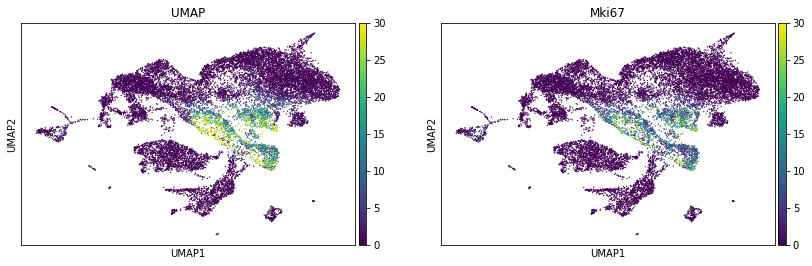

In [14]:
sc.pl.umap(adata, color=['Top2a','Mki67'], title="UMAP",vmax=30)

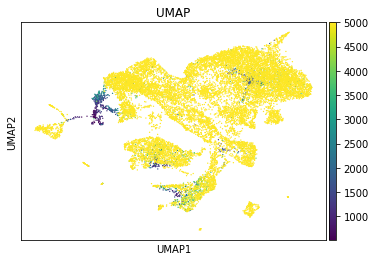

In [8]:
sc.pl.umap(adata, color=['nCount_RNA'], title="UMAP",vmax=5000)

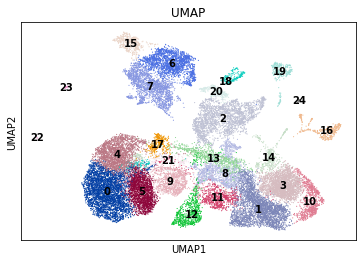

In [103]:
sc.pl.umap(adata, color=['leiden_0.6'], title="UMAP",legend_loc='on data',size=5,legend_fontsize=10,save='umap_mouse_onsite_06.pdf')

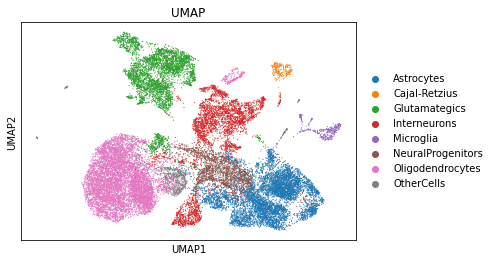

In [115]:
sc.pl.umap(adata, color=['CellType'], title="UMAP")

In [ ]:
#astrocytic genes
sc.pl.umap(adata, color=['Slc1a2','Sparcl1','Gfap'],vmax=10)

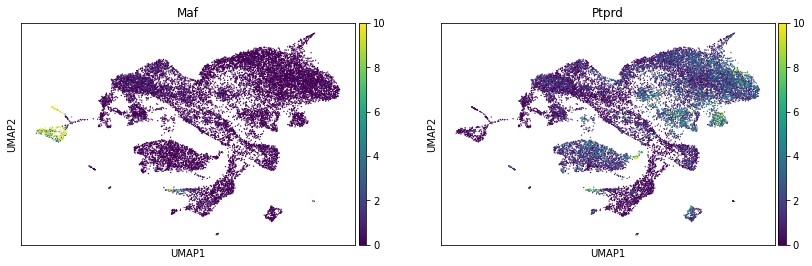

In [47]:
#astrocytic genes
sc.pl.umap(adata, color=['Maf','Ptprd'],vmax=10)

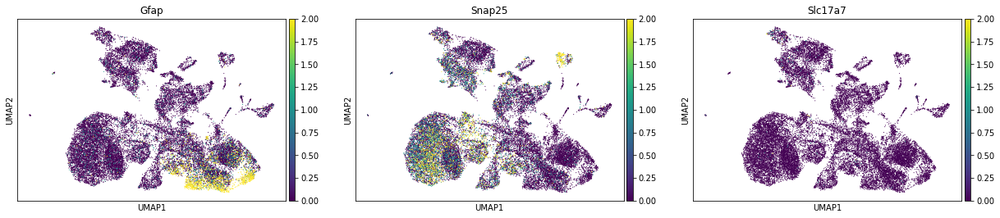

In [155]:
sc.pl.umap(adata, color=['Gfap','Snap25','Slc17a7'],vmax=2)

C:\Users\sergio.salas\Miniconda3\lib\site-packages\scanpy\tools\_rank_genes_groups.py:404: RuntimeWarning: overflow encountered in expm1
  foldchanges = (self.expm1_func(mean_group) + 1e-9) / (


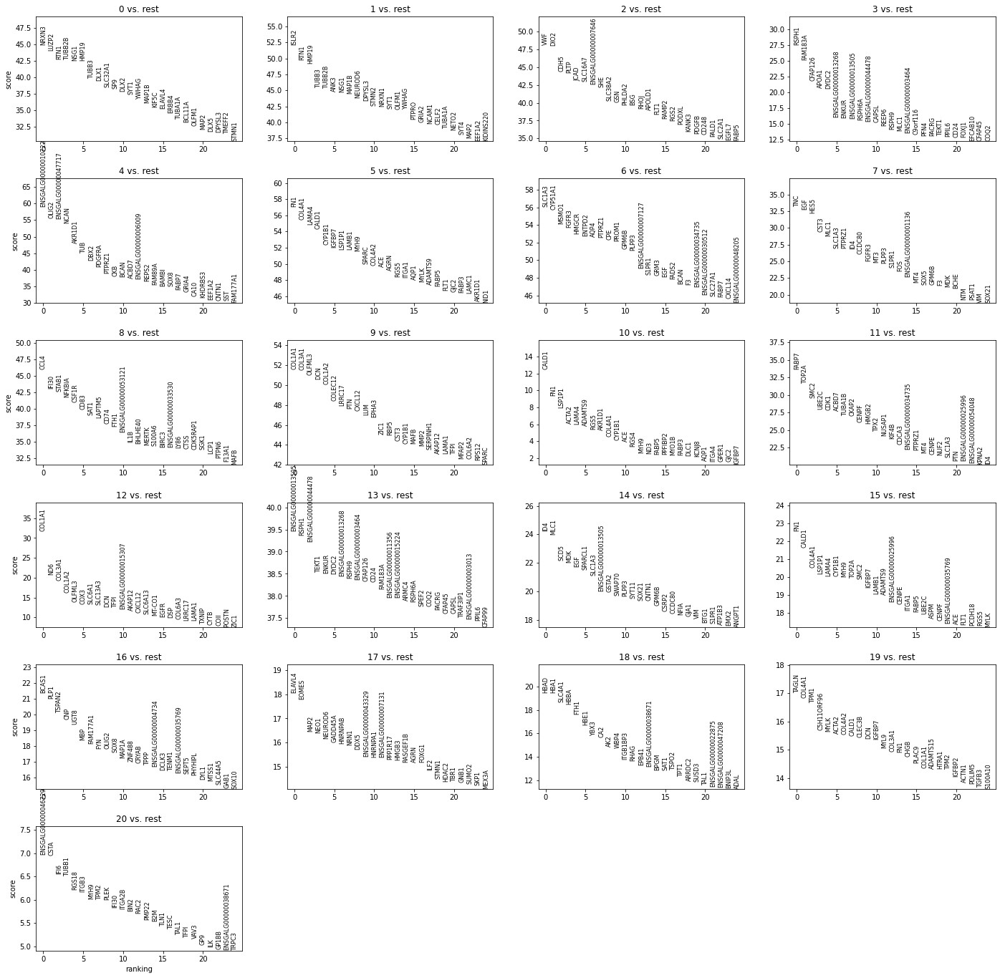

In [97]:
sc.tl.rank_genes_groups(adata, 'leiden_0.6', method='wilcoxon', key_added = "wilcoxon")
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False, key="wilcoxon")

In [104]:
markers=pd.DataFrame(adata.uns['wilcoxon']['names']).head(5)

In [112]:
mk=markers.iloc[0,:]

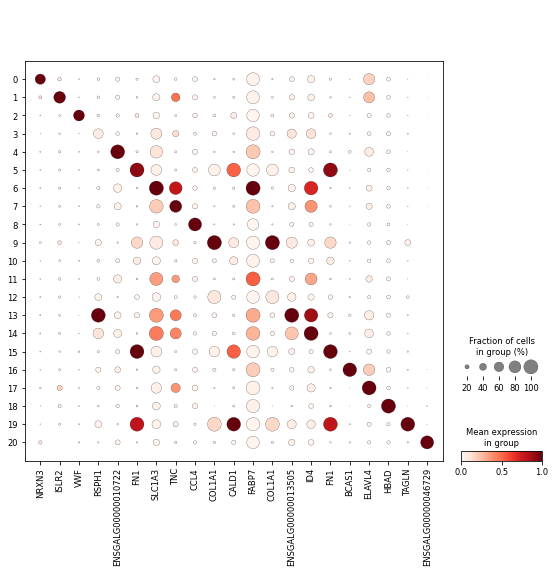

In [113]:
# convert numpy.recarray to list
mynames = ['NRXN3','ISLR2','LUZP2']
sc.pl.dotplot(adata, mk, groupby = 'leiden_0.6',standard_scale='var')


In [6]:
adata

AnnData object with n_obs × n_vars = 16825 × 2318
    obs: 'Unnamed: 0', 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'RNA_snn_res.0.2', 'RNA_snn_res.2.4', 'seurat_clusters', 'Selected_Cells', 'Condition', 'Batch', 'sample_name', 'origen', 'S.Score', 'G2M.Score', 'Phase', 'old.ident', 'RNA_snn_res.0.05', 'RNA_snn_res.0.1', 'RNA_snn_res.0.3', 'RNA_snn_res.0.4', 'RNA_snn_res.0.5', 'RNA_snn_res.0.6', 'RNA_snn_res.0.8', 'RNA_snn_res.1', 'RNA_snn_res.1.2', 'RNA_snn_res.1.8', 'Glutamatergic.mean', 'Interneurons.mean', 'CellType', 'Subclusters', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'percent_mt2', 'n_counts', 'n_genes', 'leiden_1.0', 'leiden_0.6', 'leiden_0.4', 'leiden_1.4'
    var: 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    un

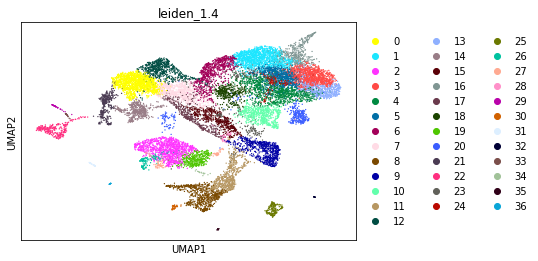

In [7]:
sc.pl.umap(adata, color=['leiden_1.4'],save='leiden1.4.pdf')

In [123]:
adataoligo=adata[adata.obs['leiden_0.6'].isin(['20','24','3','11','7','26','23'])]

In [12]:
sc.tl.rank_genes_groups(adata, 'leiden_1.4', method='wilcoxon', key_added = "wilcoxon")


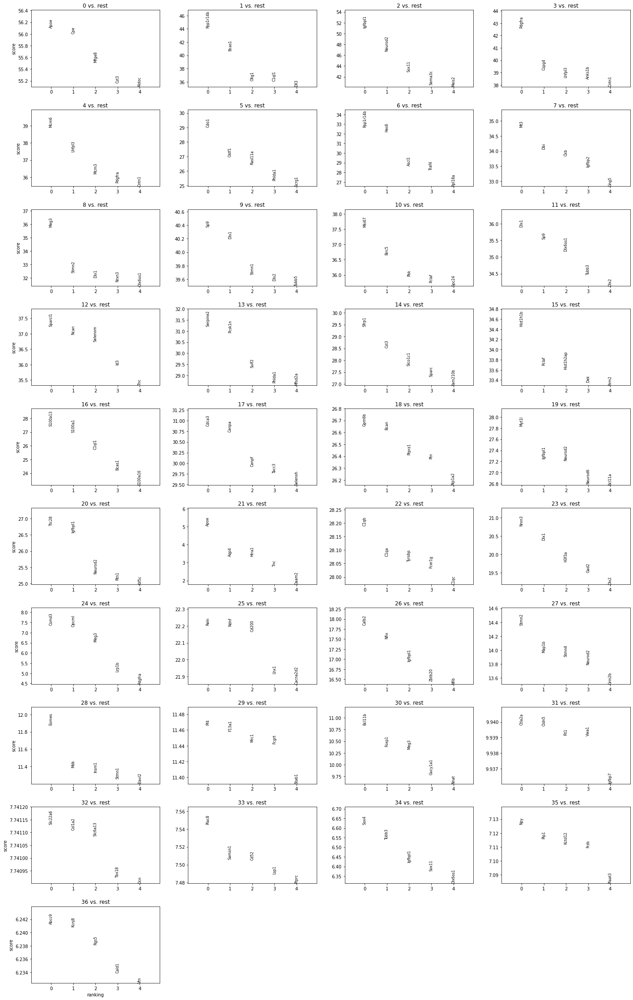

In [14]:
sc.pl.rank_genes_groups(adata, n_genes=5, sharey=False, key="wilcoxon",save='goodmarkers_mouse_neurogenesiss_1.4.pdf')

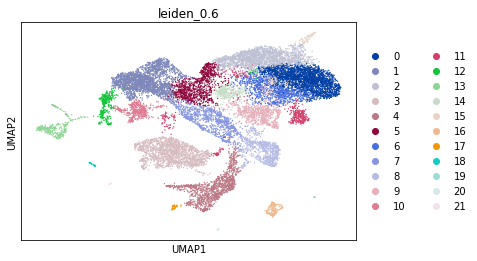

In [25]:
sc.pl.umap(adata, color=['leiden_0.6'])

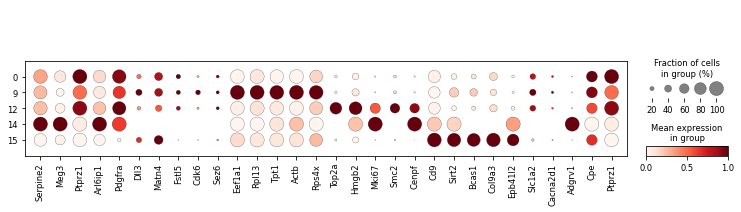

In [134]:
markers=pd.DataFrame(adata.uns['wilcoxon']['names']).head(5)
totaloligo=[]
for cols in markers.columns:
    for rows in markers.index:
        totaloligo.append(markers.loc[rows,cols])

sc.pl.dotplot(adataoligo,totaloligo, groupby = 'leiden_1.4',standard_scale='var')

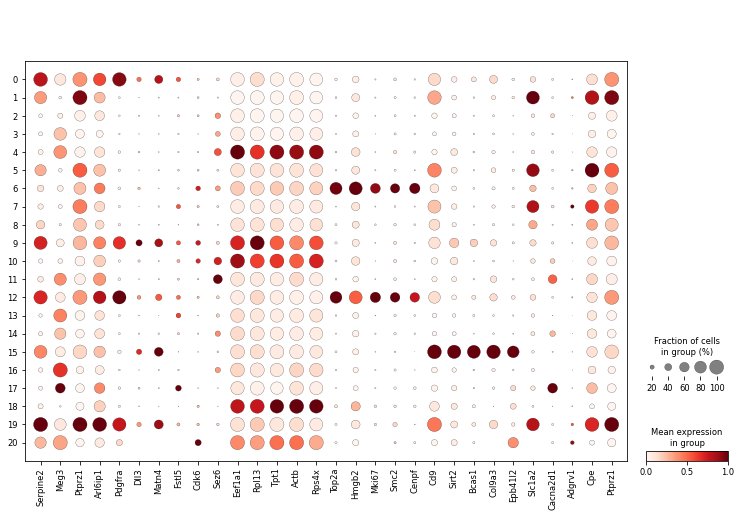

In [136]:
sc.pl.dotplot(adata,totaloligo, groupby = 'leiden_1.0',standard_scale='var')

In [41]:
adataglut=adata[adata.obs['leiden_0.6'].isin(['4'])]
adataglut=adataglut[adataglut.obs['CellType'].isin(['Interneurons'])]

In [42]:
adataglut.obs['CellType']

58       Interneurons
67       Interneurons
104      Interneurons
127      Interneurons
267      Interneurons
             ...     
26344    Interneurons
26384    Interneurons
26419    Interneurons
26451    Interneurons
26470    Interneurons
Name: CellType, Length: 1258, dtype: category
Categories (1, object): ['Interneurons']

In [43]:
sc.tl.leiden(adataglut, key_added = "leiden_1.0_sub") # default resolution in 1.0

Trying to set attribute `.obs` of view, copying.


In [44]:
adataglut

AnnData object with n_obs × n_vars = 1258 × 2318
    obs: 'Unnamed: 0', 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'RNA_snn_res.0.2', 'RNA_snn_res.2.4', 'seurat_clusters', 'Selected_Cells', 'Condition', 'Batch', 'sample_name', 'origen', 'S.Score', 'G2M.Score', 'Phase', 'old.ident', 'RNA_snn_res.0.05', 'RNA_snn_res.0.1', 'RNA_snn_res.0.3', 'RNA_snn_res.0.4', 'RNA_snn_res.0.5', 'RNA_snn_res.0.6', 'RNA_snn_res.0.8', 'RNA_snn_res.1', 'RNA_snn_res.1.2', 'RNA_snn_res.1.8', 'Glutamatergic.mean', 'Interneurons.mean', 'CellType', 'Subclusters', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'percent_mt2', 'n_counts', 'n_genes', 'leiden_1.0', 'leiden_0.6', 'leiden_0.4', 'leiden_1.4', 'leiden_1.0_sub'
    var: 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'me

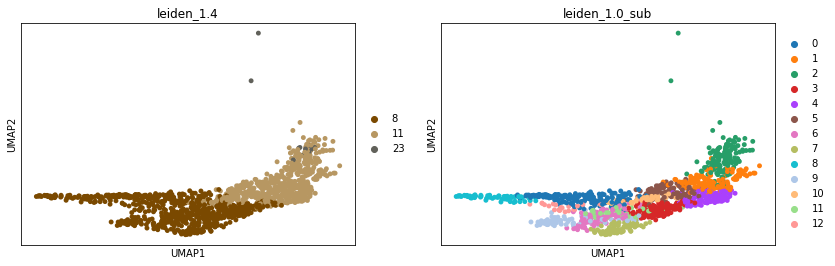

In [45]:
sc.pl.umap(adataglut, color=['leiden_1.4','leiden_1.0_sub'])

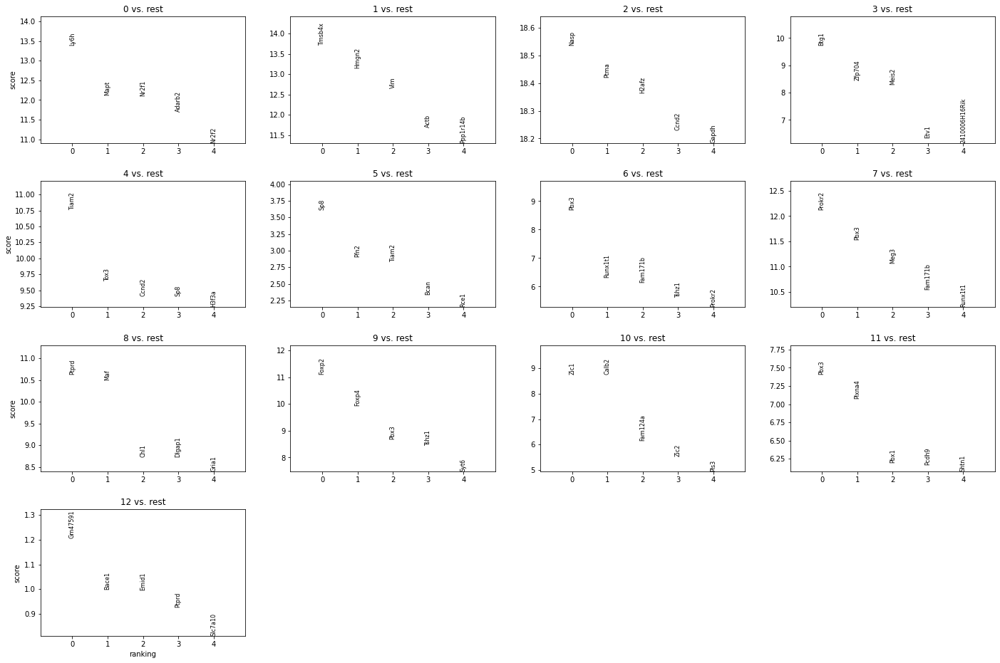

In [46]:
sc.tl.rank_genes_groups(adataglut, 'leiden_1.0_sub', method='wilcoxon', key_added = "wilcoxon")
sc.pl.rank_genes_groups(adataglut, n_genes=5, sharey=False, key="wilcoxon")

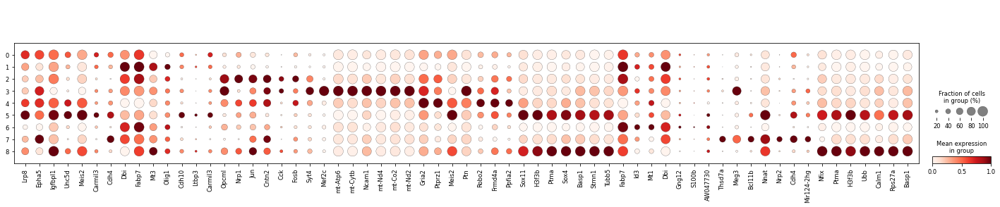

In [174]:
markers=pd.DataFrame(adataglut.uns['wilcoxon']['names']).head(7)
totalglut=[]
for cols in markers.columns:
    for rows in markers.index:
        totalglut.append(markers.loc[rows,cols])

sc.pl.dotplot(adataglut,totalglut, groupby = 'leiden_1.0_sub',standard_scale='var')

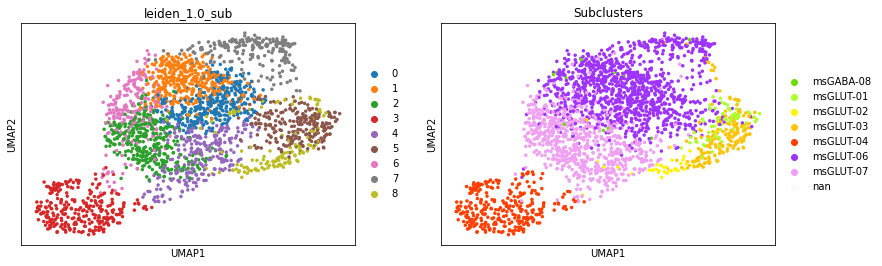

In [168]:
sc.pl.umap(adataglut, color=['leiden_1.0_sub','Subclusters'])

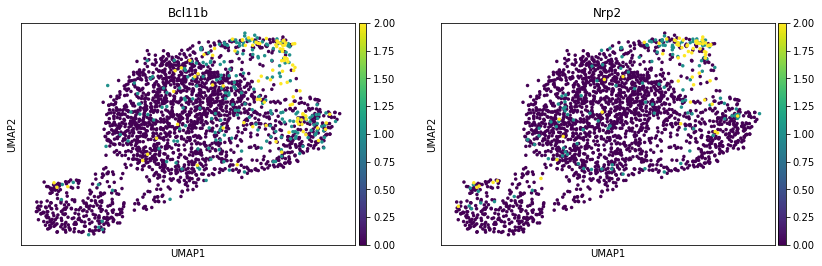

In [176]:
sc.pl.umap(adataglut, color=['Bcl11b','Nrp2'],vmax=2)

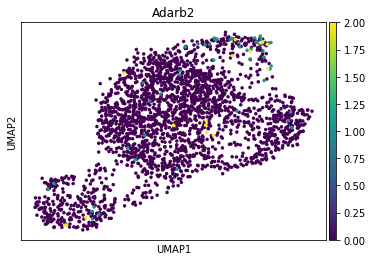

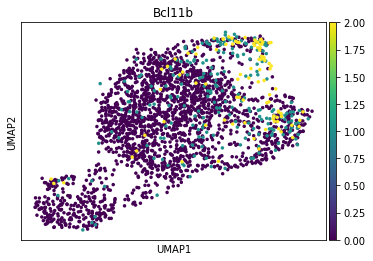

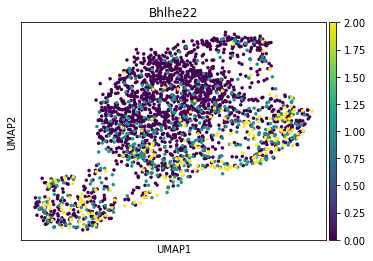

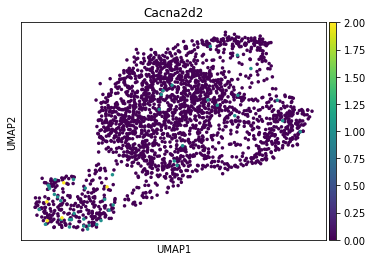

notpossible


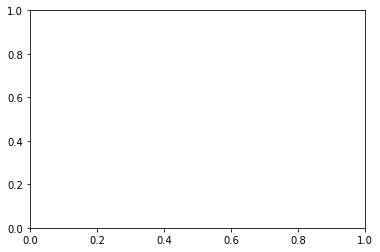

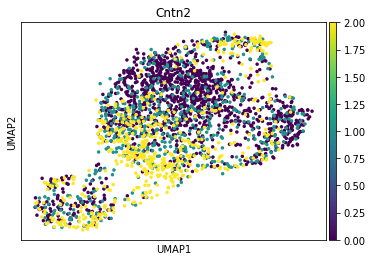

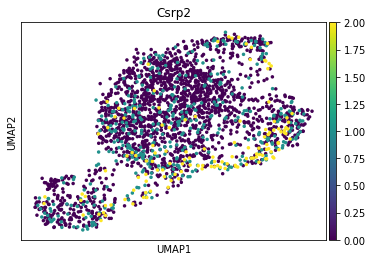

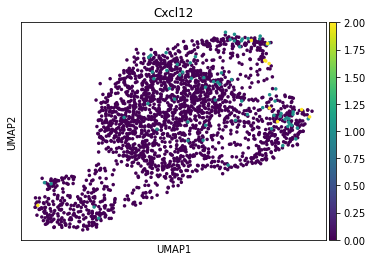

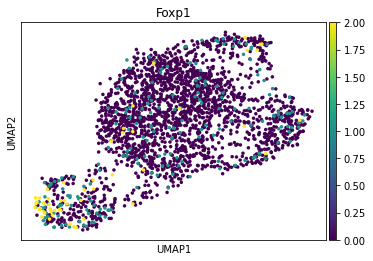

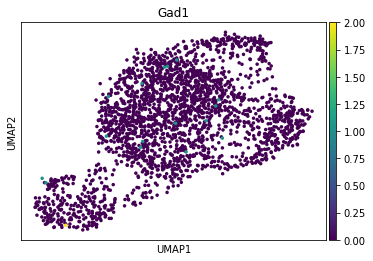

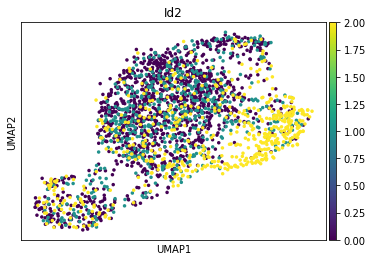

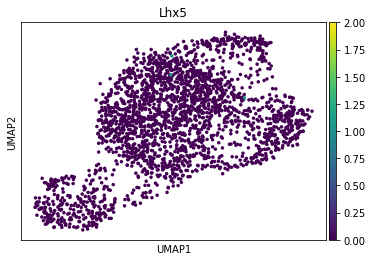

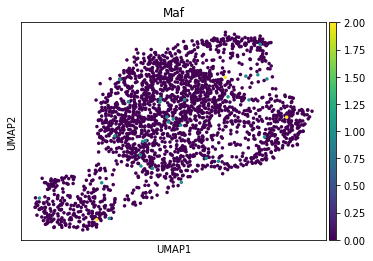

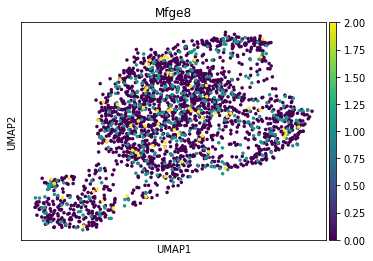

notpossible


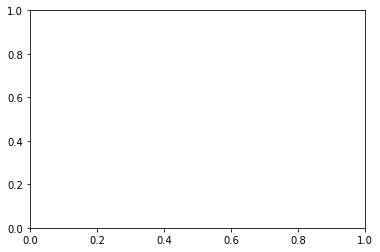

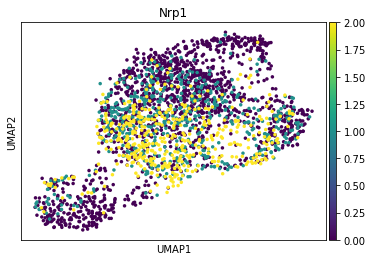

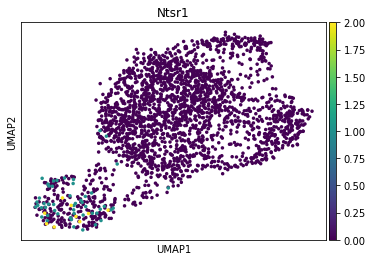

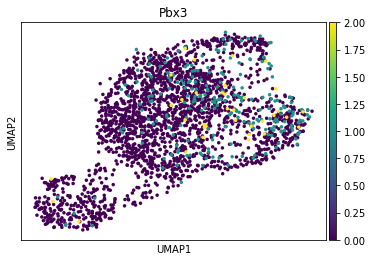

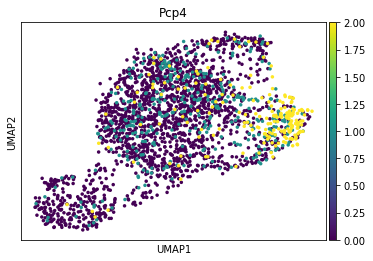

...

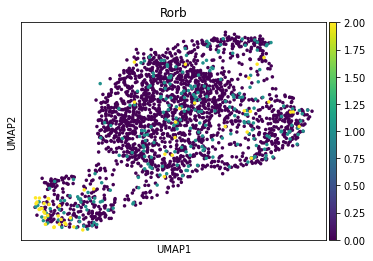

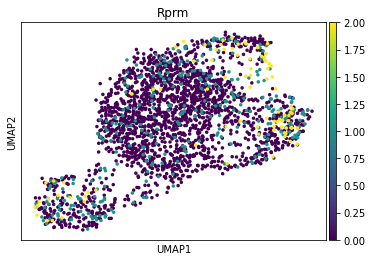

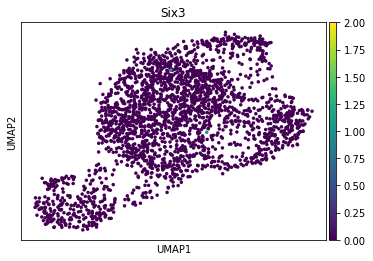

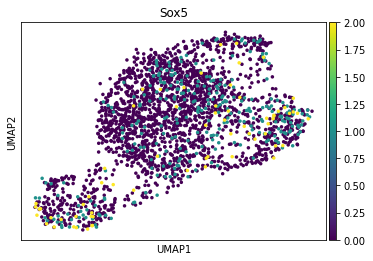

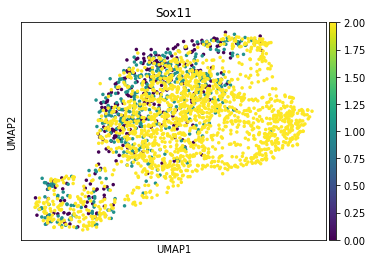

notpossible


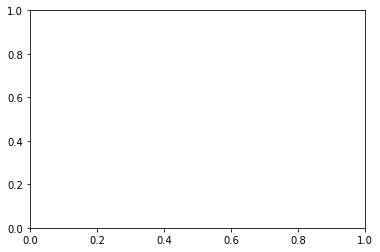

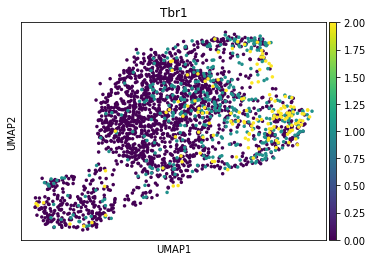

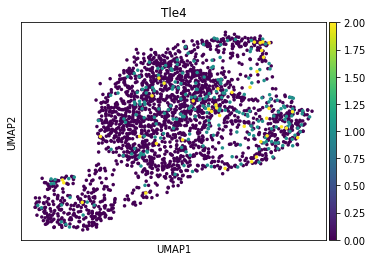

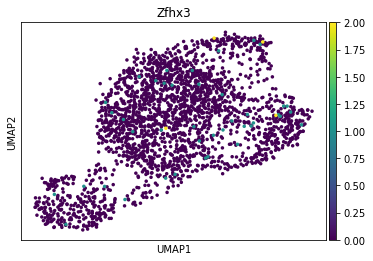

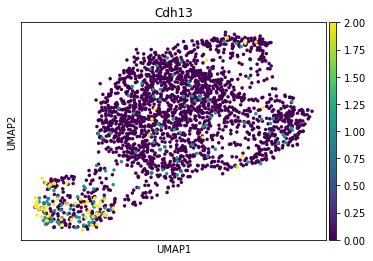

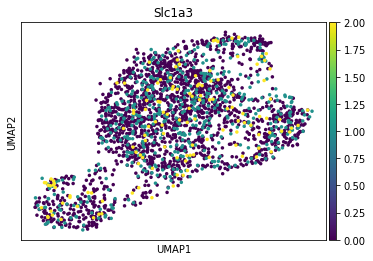

notpossible


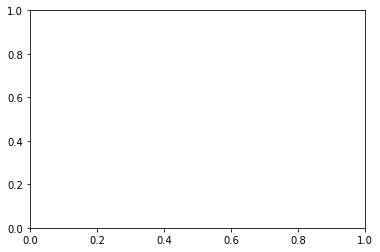

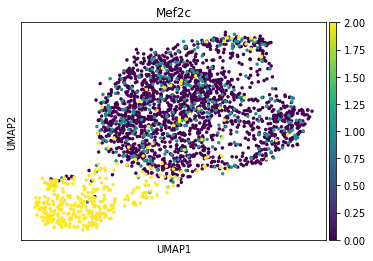

In [177]:
for e in gel['Gene']:
    try:
        sc.pl.umap(adataglut, color=[e],vmax=2)
    except:
        print('notpossible')

In [199]:
adatainter=adata[adata.obs['CellType'].isin(['Interneurons'])]
adatainter=adatainter[adatainter.obs['leiden_1.0'].isin(['6','16','17','3','4','13'])]

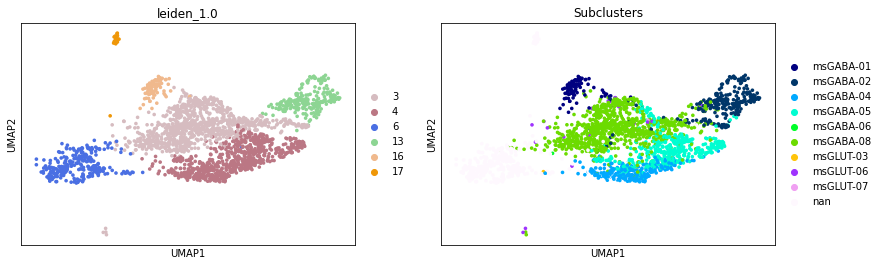

In [204]:
sc.pl.umap(adatainter, color=['leiden_1.0','Subclusters'])

In [192]:
sc.tl.leiden(adatainter, key_added = "leiden_1.0") # default resolution in 1.0

Trying to set attribute `.uns` of view, copying.


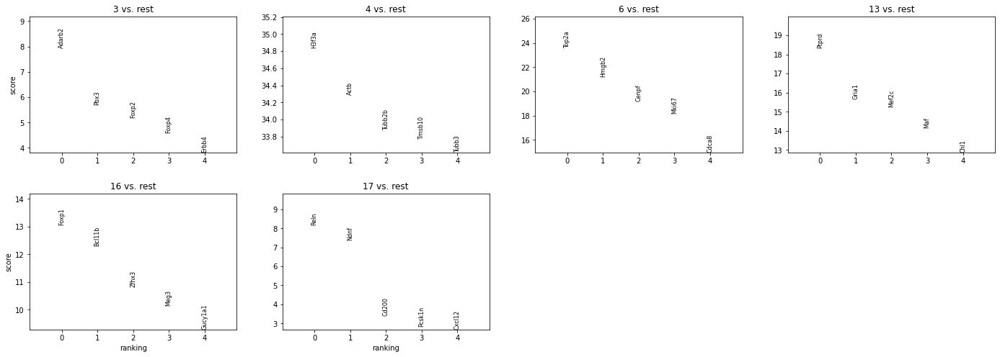

In [201]:
sc.tl.rank_genes_groups(adatainter, 'leiden_1.0', method='wilcoxon', key_added = "wilcoxon")
sc.pl.rank_genes_groups(adatainter, n_genes=5, sharey=False, key="wilcoxon")

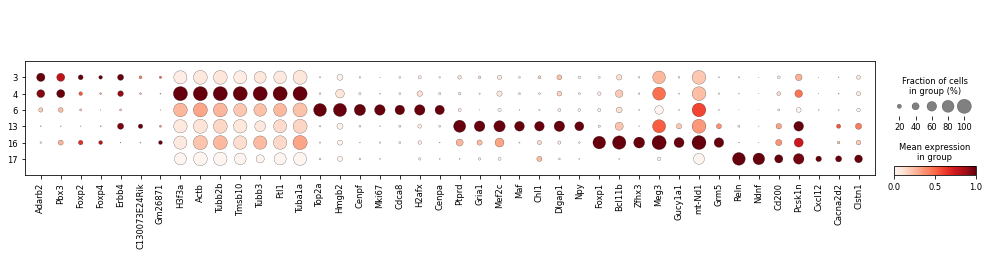

In [203]:
markers=pd.DataFrame(adatainter.uns['wilcoxon']['names']).head(7)
totalinter=[]
for cols in markers.columns:
    for rows in markers.index:
        totalinter.append(markers.loc[rows,cols])

sc.pl.dotplot(adatainter,totalinter, groupby = 'leiden_1.0',standard_scale='var')

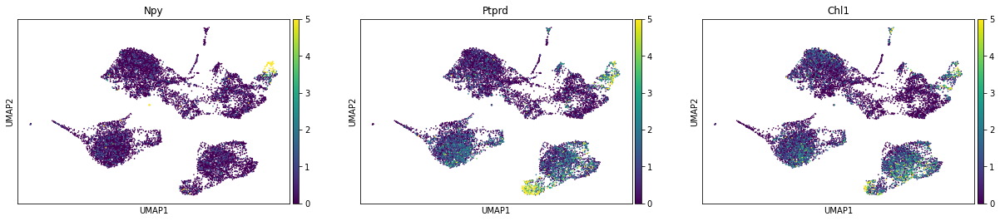

In [207]:
sc.pl.umap(adata, color=['Npy','Ptprd','Chl1'],vmax=5)

In [ ]:
# astro

In [214]:
adataastro=adata[adata.obs['CellType'].isin(['Astrocytes'])]
adataastro=adataastro[adataastro.obs['leiden_1.0'].isin(['1','2','6','7','8','5','19'])]

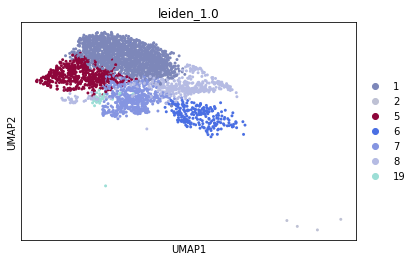

In [215]:
sc.pl.umap(adataastro, color=['leiden_1.0'])

Trying to set attribute `.uns` of view, copying.


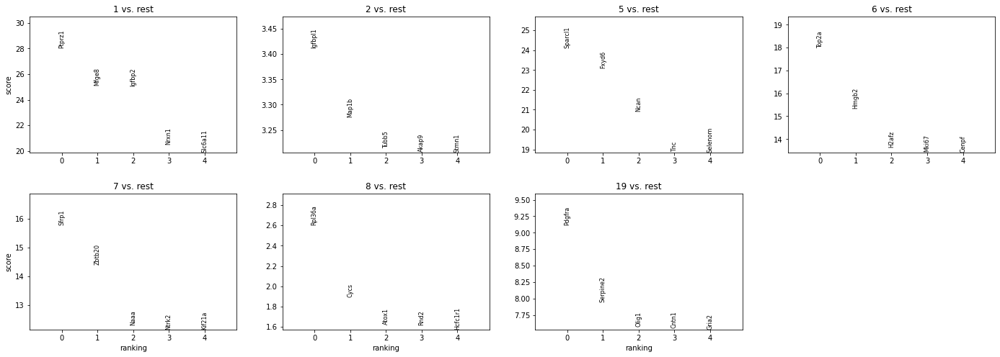

In [216]:
sc.tl.rank_genes_groups(adataastro, 'leiden_1.0', method='wilcoxon', key_added = "wilcoxon")
sc.pl.rank_genes_groups(adataastro, n_genes=5, sharey=False, key="wilcoxon")

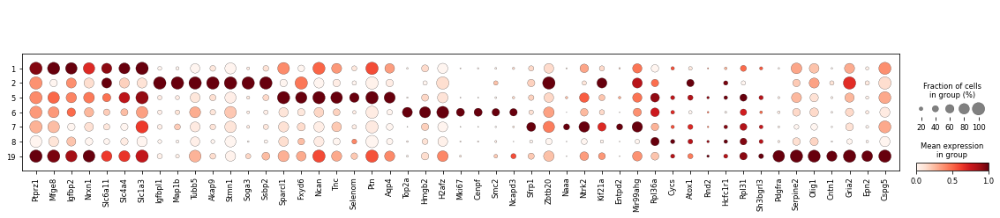

In [217]:
markers=pd.DataFrame(adataastro.uns['wilcoxon']['names']).head(7)
totalastro=[]
for cols in markers.columns:
    for rows in markers.index:
        totalastro.append(markers.loc[rows,cols])

sc.pl.dotplot(adataastro,totalastro, groupby = 'leiden_1.0',standard_scale='var')